#### 1 WT4, DJF (Wet California) (ERA-Interim 850hPa 12Z)
 - 1.1) Find the top 25% of years that have the highest frequency of WT4 in DJF
 - 1.2) Calculate the seasonal mean Z500 for those top 25% of years.
 - 1.3) Calculate the seasonal mean/STD over all years. 
 - 1.4) Plot the anomaly of the top 25% of years (P75-climatoloty)/stddev(climatoloty) 
#### 2 WT9 JAS (Wet Monson) 
 - 2.1) Find the top 25% of years that have the highest frequency of WT9 in ASO
 - 2.2) Calculate the seasonal mean Z500 for those top 25% of years.
 - 2.3) Calculate the seasonal mean/STD over all years. 
 - 2.4) Plot the anomaly of the top 25% of years (P75-climatoloty)/stddev(climatoloty) 
#### 3 WT Seasonal climatology

In [2]:
# similar plot for  ERAI, SMYLE and ECMWF (SST and Z500)

In [1]:
import sys
import os
import datetime
import calendar
import numpy as np
import pandas as pd
from pandas.tseries.offsets import MonthEnd
import xarray as xr
import cfgrib
import matplotlib.pyplot as plt
import glob 
import os.path
import cartopy 
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# inorder to import my pathon module, add
# $PYTHONPATH for jupyter for module
sys.path.append("/glade/u/home/mingge/PYTHON")
import coexist_func 
from importlib import reload
reload(coexist_func)
from coexist_func import plot_single
from coexist_func import find_year_top25_wt_erai
from coexist_func import cal_seasonalmean_wt_qspd850_erai
from coexist_func import ax_coastlines_country
from coexist_func import cal_season_std_qspd850_erai
from coexist_func import cal_season_cli_qspd850_erai
from coexist_func import cal_season_ano_qspd850_erai
from coexist_func import plot_prec_12
from coexist_func import datestdtojd 

casper_2020

#### setups

In [2]:
dir_erai = '/gpfs/fs1/collections/rda/data/ds627.0/ei.oper.an.pl/'
dir_o    = '/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/'
dir_wt   = dir_o + 'WT/'
dir_qspd = dir_o + 'qspd850/'

season_dict = {
    'DJF': [12,1,2],
    'MAM': [3,4,5],
    'JJA': [6,7,8],
    'SON': [9,10,11],
    'JAS': [7,8,9]}

n_season = len(season_dict)

year_s = 1979
year_e = 2014
n_year = year_e - year_s + 1

n_wt = 12

lat_s = -20
lat_e = 80
lon_s = 0
lon_e = 360

### check on data
 - cfgrib support xr.open_dataset engine="cfgrib"
 - engine="cfgrib"
##### NOTE: 
 - to avoid idx error, use backend_kwargs={'indexpath' :''})
 - in backend_kwargs filter_by_keys set file name and level like:
      "filter_by_keys": {"shortName": "z", "typeOfLevel": "isobaricInhPa"}

In [3]:
flnm_test = dir_erai + '201402/ei.oper.an.pl.regn128sc.2014022812'
#z = xr.open_dataset(flnm_test, engine="cfgrib", backend_kwargs={'indexpath' :'', \
#                    "filter_by_keys": {"shortName": "z", "typeOfLevel": "isobaricInhPa"}})
ds = xr.open_dataset(flnm_test, engine="cfgrib", backend_kwargs={'indexpath' :'' })
print('original Q dataset', flnm_test)
#print(ds)
#ds['q'].loc[850].plot()

#z500 = ds.z.sel(isobaricInhPa=850,latitude=slice(lat_e, lat_s)) 
#z500.plot()

#n_lat  = ds.dims['latitude']
#n_lon  = ds.dims['longitude']

latitude = ds['latitude'].sel(latitude=slice(lat_e, lat_s)) 
longitude = ds['longitude'] # 0-360
n_lat = len(latitude)
n_lon = len(longitude)
#print(latitude)
print(longitude)

/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/xarray/backends/plugins.py:71: RuntimeWarning: Engine 'cfgrib' loading failed:
module 'cfgrib.messages' has no attribute 'DEFAULT_INDEXPATH'
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


original Q dataset /gpfs/fs1/collections/rda/data/ds627.0/ei.oper.an.pl/201402/ei.oper.an.pl.regn128sc.2014022812
<xarray.DataArray 'longitude' (longitude: 512)>
array([  0.      ,   0.703125,   1.40625 , ..., 357.89075 , 358.593875,
       359.297   ])
Coordinates:
    number      int64 ...
    time        datetime64[ns] ...
    step        timedelta64[ns] ...
  * longitude   (longitude) float64 0.0 0.7031 1.406 2.109 ... 357.9 358.6 359.3
    valid_time  datetime64[ns] ...
Attributes:
    units:          degrees_east
    standard_name:  longitude
    long_name:      longitude


original U850 /gpfs/fs1/collections/rda/data/ds627.0/ei.oper.an.pl/201402/ei.oper.an.pl.regn128uv.2014022812


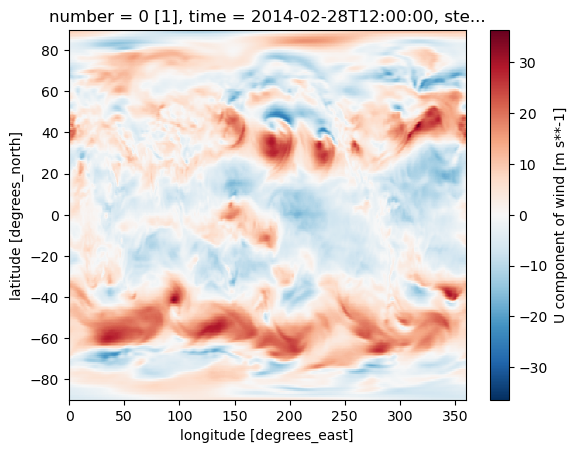

In [4]:
flnm_test = dir_erai + '201402/ei.oper.an.pl.regn128uv.2014022812'
ds = xr.open_dataset(flnm_test, engine="cfgrib", backend_kwargs={'indexpath' :'' })
print('original U850', flnm_test)
#print(ds)
ds['u'].loc[850].plot()

#### calculate 850 hPa qspd from Q, U,V

In [9]:
dir_qspd = dir_o + 'qspd850/'
 
for year in range(year_s, year_e+1, 1):
    for nm in range(12):
        mon_s = str(nm+1).zfill(2)
        lastday_month = calendar.monthrange(year, nm+1)[1]
        #flnm_oo = dir_qspd + 'qspd850_' +  str(year) + '-' + mon_s + '12Z.nc'
        flnm_o = dir_qspd + 'qspd850_' +  str(year) + mon_s + '_12Z.nc'
         
        if os.path.isfile(flnm_o):
            if year == year_e and nm == 11:
                print(year_s, '-', year_e)
                print(flnm_o, 'exist')
                #cmd = 'mv ' + flnm_oo + ' ' + flnm_o
                #os.system(cmd)
        else:
            for day in range(1, lastday_month+1):
                day_s = str(day).zfill(2)
                flnm_q = dir_erai + str(year) + mon_s + '/ei.oper.an.pl.regn128sc.' \
                        + str(year) + mon_s + day_s + '12'
                ds_q = xr.load_dataset(flnm_q, engine="cfgrib",  backend_kwargs={'indexpath' :''})
                q850 = ds_q['q'].loc[850].sel(latitude=slice(lat_e, lat_s))
            
                flnm_uv = dir_erai + str(year) + mon_s + '/ei.oper.an.pl.regn128uv.' \
                        + str(year) + mon_s + day_s + '12'
                ds_uv = xr.load_dataset(flnm_uv, engine="cfgrib",  backend_kwargs={'indexpath' :''})
                u850 = ds_uv['u'].loc[850].sel(latitude=slice(lat_e, lat_s))
                v850 = ds_uv['v'].loc[850].sel(latitude=slice(lat_e, lat_s))
            
                if day == 1:
                    print(flnm_q)
                
                qspd = (q850 *(u850 *u850  + v850 *v850 )**(1/2)).rename('qspd850')
                 
                if day == 1:
                    data_4d = qspd.copy()
                else:
                    data_4d = xr.concat([data_4d, qspd], dim='day')
                
            print(flnm_o)
            data_4d.to_netcdf(flnm_o)  
             
print('finish')

1979 - 2014
/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/qspd850/qspd850_201412_12Z.nc exist
finish


#### 1.1) Find the top 25% of years that have the highest frequency of  WT4 in DJF

In [33]:
# for winter DJF season_dict[1]
key = 'DJF'

# target WT 4
wt_t = 4

year_p75 = find_year_top25_wt_erai(year_s, year_e, season_dict, dir_erai, dir_wt, wt_t, key)  

no 1997 12
no 1998 2
no 2002 1
no 2006 2
no 2009 1
no 2014 12
top 25% years are Int64Index([1981, 2004, 1994, 1991, 1992, 1995, 1993, 2005, 1987], dtype='int64')


[1981, 2004, 1994, 1991, 1992, 1995, 1993, 2005, 1987] 

 - 1.2) Calculate the seasonal mean Z500 for those top 25% of years.

In [34]:
flnm_o = dir_o + 'qspd850_p75_wt' + str(wt_t) + '_'+ key +'.nc'
z500_p75_2d_xr = cal_seasonalmean_wt_qspd850_erai('qspd850', dir_qspd, season_dict, key, year_p75, latitude, longitude, lat_s, lat_e, flnm_o)

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/qspd850_p75_wt4_DJF.nc exist
Frozen({'latitude': 143, 'longitude': 512})


- 1.3) read the seasonal mean and STD over all years

In [35]:
flnm_o = dir_o + 'qspd850_'+ key +'_MeanStd.nc'
var_cli_xr = cal_season_std_qspd850_erai('qspd850', dir_qspd, season_dict, key, year_s, year_e, latitude, longitude, lat_s, lat_e, flnm_o)
var_xr = var_cli_xr[0]
var_std_xr= var_cli_xr[1]

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/qspd850_DJF_MeanStd.nc exist


 - 1.4) Plot the anomaly of the top 25% of years (P75-climatoloty)/stddev(climatoloty) 

/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'vcenter'
  result = super().contourf(*args, **kwargs)


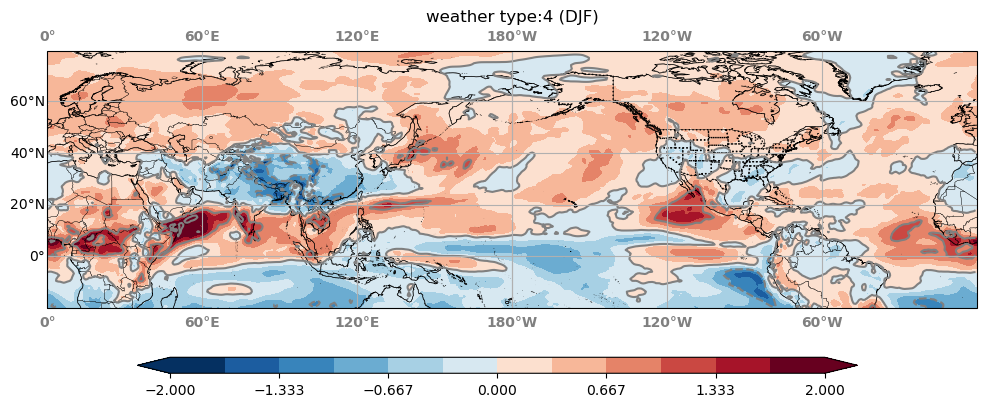

In [36]:
ano_2d = (z500_p75_2d_xr - var_xr)/var_std_xr
plot_single(ano_2d, wt_t, key, -2, 2, 13)

#### 2) WT9 (wet monsoon) for JAS.
 - 2.1) Find the top 25% of years that have the highest frequency of WT9 in JAS

In [37]:
# for winter DJF season_dict[1]
key = 'JAS'

# target WT 9
wt_t = 9

year_p75 = find_year_top25_wt_erai(year_s, year_e, season_dict, dir_erai, dir_wt, wt_t, key) 

no 2010 9
no 2011 7
top 25% years are Int64Index([1994, 1991, 2002, 1997, 1990, 2013, 1996, 2009, 2014], dtype='int64')


 - 2.2) Calculate the seasonal mean Z50 for those top 25% of years.

In [38]:
flnm_o = dir_o + 'qspd850_p75_wt' + str(wt_t) + '_'+ key +'.nc'
z500_p75_2d_xr = cal_seasonalmean_wt_qspd850_erai('qspd850', dir_qspd, season_dict, key, year_p75, latitude, longitude, lat_s, lat_e, flnm_o)

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/qspd850_p75_wt9_JAS.nc exist
Frozen({'latitude': 143, 'longitude': 512})


 - 2.3)  read the seasonal mean and STD over all years

In [39]:
flnm_o = dir_o + 'qspd850_'+ key +'_MeanStd.nc'
var_cli_xr = cal_season_std_qspd850_erai('qspd850', dir_qspd, season_dict, key, year_s, year_e, latitude, longitude, lat_s, lat_e ,flnm_o)
var_xr = var_cli_xr[0]
var_std_xr= var_cli_xr[1]

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/qspd850_JAS_MeanStd.nc exist


 - 2.4) Plot the anomaly of the top 25% of years (P75-climatoloty)/stddev(climatoloty)

/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1662: UserWarning: The following kwargs were not used by contour: 'vcenter'
  result = super().contourf(*args, **kwargs)


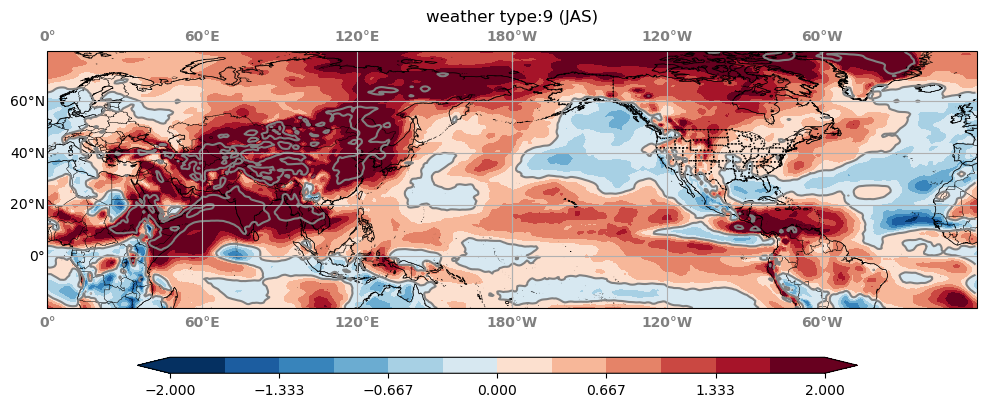

In [40]:
ano_2d = (z500_p75_2d_xr - var_xr)/var_std_xr
plot_single(ano_2d, wt_t, key, -2, 2, 13)

#### 3 Seasonal climatology

In [7]:
flnm_o = dir_o + 'qspd850_seasonal_cli.nc'
z500_cli_xr = cal_season_cli_qspd850_erai('qspd850', dir_qspd, season_dict, year_s, year_e, latitude, longitude, lat_s, lat_e, flnm_o)

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/qspd850_seasonal_cli.nc exist
Frozen({'season': 4, 'latitude': 143, 'longitude': 512})


 - 3.2) seasonal anomaly

In [8]:
flnm_cli = dir_o + 'qspd850_seasonal_cli.nc'
flnm_o = dir_o + 'qspd850_seasonal_ano.nc'
z500_wt = cal_season_ano_qspd850_erai('qspd850', dir_qspd, dir_wt, season_dict, year_s, year_e, latitude, longitude, lat_s, lat_e, flnm_cli, flnm_o)

/glade/campaign/mmm/c3we/mingge/COEXIST/ERAI/qspd850_seasonal_ano.nc exist


/glade/work/mingge/miniconda3/envs/casper_2020/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1614: UserWarning: No contour levels were found within the data range.
  result = super().contour(*args, **kwargs)


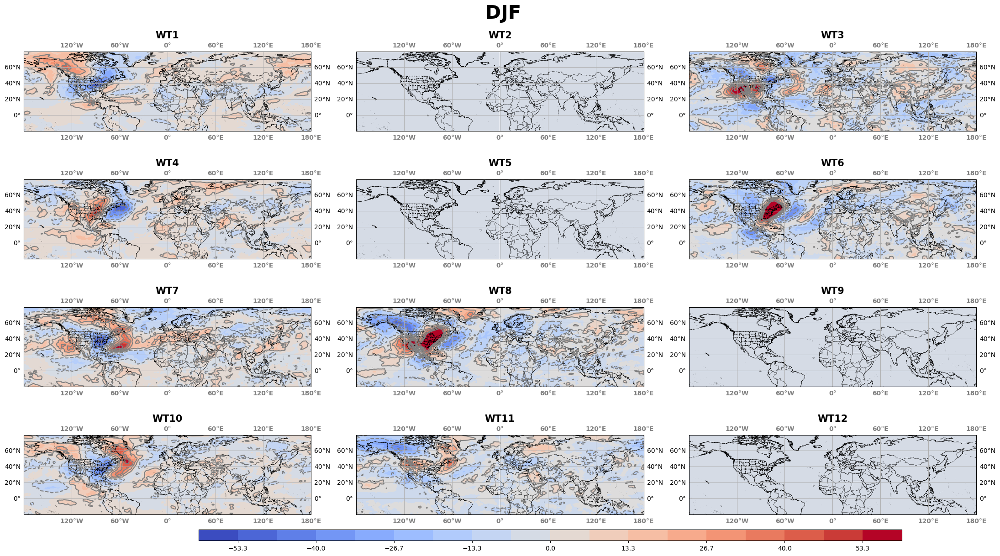

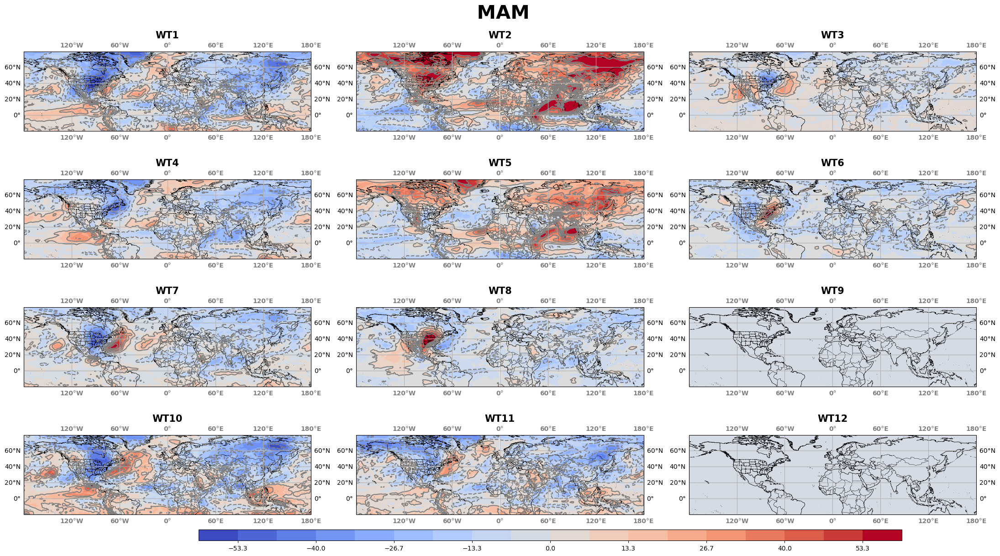

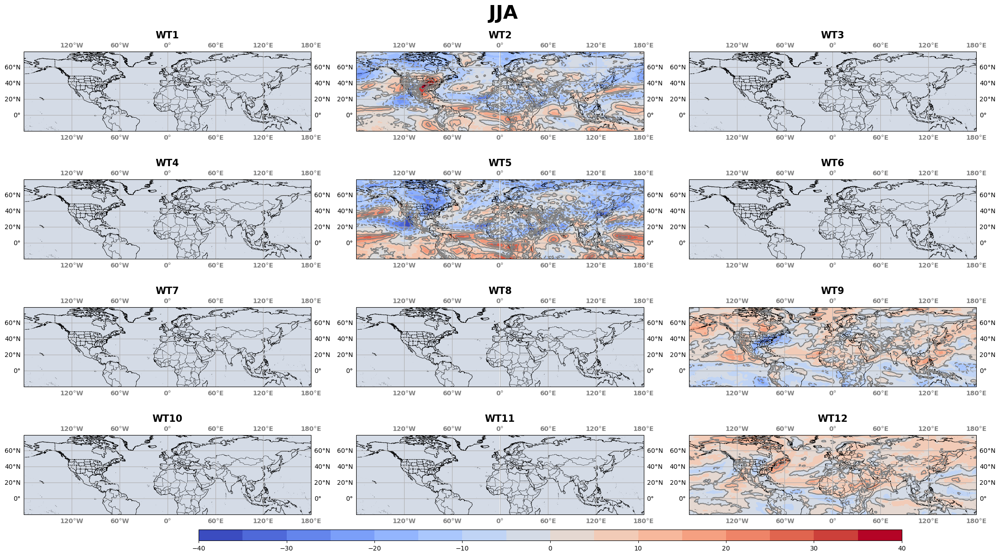

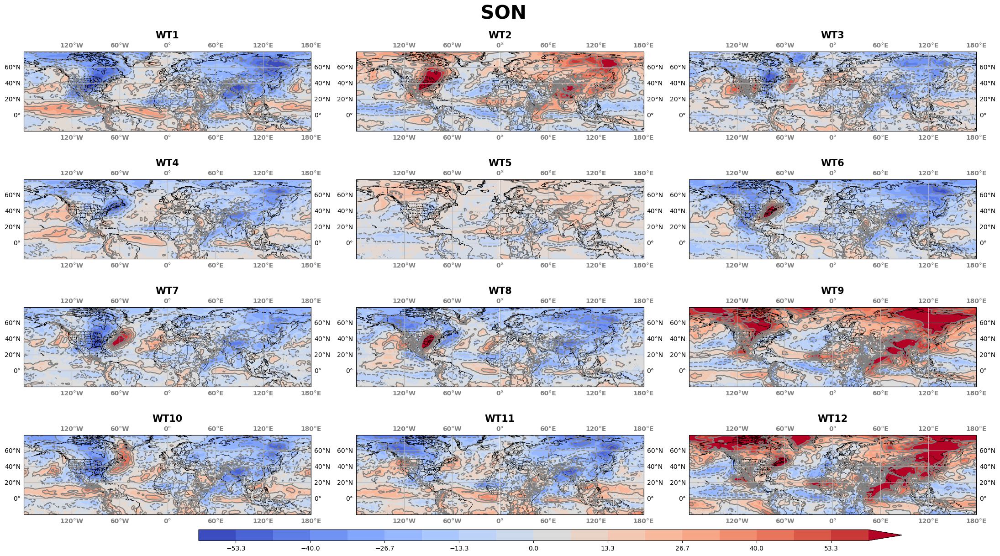

In [46]:
season_s = ['DJF','MAM','JJA','SON']            

# Because proj = ccrs.PlateCarree(central_longitude=180)
# I need to convert longitude from [-180, 180] -> [0,360]
z500_wt.coords['longitude'] = xr.where(z500_wt['longitude'] < 0, z500_wt['longitude'] + 360, z500_wt['longitude'])
z500_wt = z500_wt.sortby(z500_wt.longitude)

# plot 4 seasons
for ns in range(4):
    if ns == 2:
        plot_prec_12(z500_wt[:,ns]*100, -40, 40, 17, 'coolwarm', 'horizontal', season_s[ns]);
    else:
        plot_prec_12(z500_wt[:,ns]*100, -60, 60, 19, 'coolwarm', 'horizontal', season_s[ns]); 
